In [6]:
%load_ext autoreload
%autoreload 2

import sys
sys.path.insert(-1, '/Users/ponddie/Documents/py/mda_project/explo/yenha/lib')
from hahelper import *

import pandas as pd, numpy as np
import geopandas as gpd

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [7]:
pd.options.display.max_columns=1000
pd.options.display.max_rows=1000

PATH_EXTRA_DATA = "../../data/extra/"
PATH_TRAFFIC = "../../data/traffic/"
PATH_RICH = '../../data/richtingen.csv'
PATH_SITES = '../../data/sites.csv'

## A. Data Cycling

### 1. Richtingen

In [22]:
df_rich = pd.read_csv(PATH_RICH, header=None)
df_rich.columns=['siteid', 'richting', 'naam']
print(df_rich.shape)
df_rich.head()

(305, 3)


,siteid,richting,naam
0,1,IN,Machelen Cyclists rich. Brucargo
1,1,OUT,Machelen Cyclists richting Machelen
2,2,IN,Brasschaat 2 Fietsers rich Merksem
3,2,OUT,Brasschaat 2 Fietsers rich Brasschaat
4,3,IN,Brasschaat 1 Fietsers rich Merksem


In [23]:
df_rich['from'] = df_rich['naam'].apply(lambda x: x.split()[0])
df_rich['to'] = df_rich['naam'].apply(lambda x: x.split()[-1])

In [24]:
df_rich[['from','to']].drop_duplicates().tail(20)

,from,to
284,YTH17062596,IN
285,YTH17062596,OUT
286,Overijse,UIT
287,Overijse,IN]
288,Overijse,OUT]
289,Overijse,Ijsebos]
290,Test,IN
291,TEST,IN
292,TEST,UIT
294,Overijse,Nieuwland]


In [25]:
df_rich[~df_rich['richting'].isin(['IN','OUT'])]

,siteid,richting,naam,from,to
37,7,IN/OUT,Evergem_1 [Debug],Evergem_1,[Debug]
44,34,IN/OUT,Heers_1 [Debug],Heers_1,[Debug]
194,102,IN/OUT,Diest_2 [Bike],Diest_2,[Bike]
240,1,IN/OUT,Machelen [Debug],Machelen,[Debug]


In [26]:
df_rich['siteid'].value_counts()

siteid
1      3
102    3
34     3
7      3
110    2
105    2
106    2
107    2
108    2
109    2
71     2
72     2
73     2
74     2
75     2
76     2
103    2
104    2
101    2
100    2
112    2
77     2
64     2
65     2
66     2
67     2
68     2
69     2
70     2
91     2
99     2
92     2
93     2
94     2
95     2
96     2
97     2
98     2
111    2
113    2
89     2
114    2
134    2
135    2
136    2
137    2
138    2
139    2
140    2
143    2
146    2
147    2
142    2
148    2
149    2
150    2
151    2
133    2
132    2
131    2
121    2
115    2
116    2
117    2
118    2
119    2
120    2
122    2
129    2
123    2
125    2
126    2
127    2
128    2
124    2
90     2
88     2
2      2
87     2
32     2
33     2
35     2
36     2
37     2
38     2
144    2
145    2
8      2
9      2
11     2
12     2
13     2
14     2
15     2
31     2
30     2
29     2
20     2
3      2
4      2
5      2
6      2
10     2
19     2
21     2
28     2
22     2
23     2
24     2
25     2
26 

Filter out siteid with error In/Out

In [27]:
df_rich = df_rich.query('richting!="IN/OUT"')
df_rich.shape, df_rich['siteid'].nunique()

((301, 5), 151)

### 2. Sites

In [28]:
df_sites = pd.read_csv(PATH_SITES, header=None)
df_sites.columns=['siteid', 'sitenr', 'long', 'lat', 'naam', 'domein', 'wegnr', 'district', 'gemeente', 'interval', 'datum_van']
print(df_sites.shape)
df_sites.head()

(151, 11)


,siteid,sitenr,long,lat,naam,domein,wegnr,district,gemeente,interval,datum_van
0,1,100046096,4.456122,50.916183,Machelen,Vlaamse Overheid A. Wegen enVerkeer,T2110002,AWV212,Machelen,15,2019-08-22
1,2,100052862,4.471690,51.275120,Brasschaat 2,Vlaamse Overheid A. Wegen enVerkeer,N0010002,AWV123,Brasschaat,15,2019-08-22
2,3,100052863,4.472220,51.275030,Brasschaat 1,Vlaamse Overheid A. Wegen enVerkeer,N0010001,AWV123,Brasschaat,15,2019-08-22
3,4,100052864,5.190110,51.160230,Balen 1,Vlaamse Overheid A. Wegen enVerkeer,N0180002,AWV114,Balen,15,2019-08-22
4,5,100052865,5.190030,51.160180,Balen 2,Vlaamse Overheid A. Wegen enVerkeer,N0180002,AWV114,Balen,15,2019-08-22


In [29]:
df_sites['siteid'].nunique()

151

In [30]:
df_sites['domein'].value_counts()

domein
Vlaamse Overheid A. Wegen enVerkeer     142
Vlaamse Overheid A. Wegen en Verkeer      8
Kortrijk Fietst                           1
Name: count, dtype: int64

In [31]:
df_sites.describe()

,siteid,sitenr,long,lat,interval
count,151.000000,1.510000e+02,151.000000,151.000000,151.000000
mean,76.145695,2.655954e+08,4.364879,51.010527,14.801325
std,43.951245,7.575055e+07,0.810268,0.154309,4.578238
min,1.000000,1.000389e+08,2.742890,50.751280,0.000000
25%,38.500000,3.000235e+08,3.768264,50.886897,15.000000
50%,76.000000,3.000256e+08,4.471690,50.990394,15.000000
75%,113.500000,3.000273e+08,4.937732,51.134365,15.000000
max,152.000000,3.000621e+08,5.797260,51.357520,60.000000


In [32]:
df_sites['wegnr'].apply(lambda x: str(x)[0]).unique()

array(['T', 'N', 'R', 'A', 'n'], dtype=object)

In [33]:
df_sites[['siteid','long','lat','naam']].rename(columns={'long':'longtitude','lat':'latitude',}).to_csv('data/site_latlong.csv', index=False)

In [34]:
df_sites['datum_van'].min(), df_sites['datum_van'].max()

('2019-08-22', '2025-10-31')

In [35]:
df_rich['siteid'].nunique(), df_sites['siteid'].nunique(), df_sites['sitenr'].nunique()

(151, 151, 151)

### 3. Traffic

##### Count data

In [8]:
total_rows = 0
total_files=0
for file in os.listdir(PATH_TRAFFIC):
    if file.startswith('data'):
        filepath = os.path.join(file)
        df = pd.read_csv(PATH_TRAFFIC+filepath)
        print(file, df.shape)
        total_files+=1
        total_rows += df.shape[0]

data-2024-03.csv (821375, 6)
data-2024-02.csv (768383, 6)
data-2019-08.csv (123147, 6)
data-2023-09.csv (796193, 6)
data-2023-08.csv (815423, 6)
data-2024-01.csv (823363, 6)
data-2019-09.csv (138239, 6)
data-2021-09.csv (155519, 6)
data-2024-11.csv (804763, 6)
data-2024-05.csv (816615, 6)
data-2024-04.csv (794879, 6)
data-2024-10.csv (809495, 6)
data-2021-08.csv (160703, 6)
data-2026-01.csv (863721, 6)
data-2026-03.csv (351505, 6)
data-2024-06.csv (789119, 6)
data-2024-12.csv (830905, 6)
data-2024-07.csv (815423, 6)
data-2026-02.csv (784599, 6)
data-2025-08.csv (855837, 6)
data-2022-01.csv (160703, 6)
data-2020-04.csv (143999, 6)
data-2020-10.csv (148799, 6)
data-2020-11.csv (143999, 6)
data-2020-05.csv (148799, 6)
data-2025-09.csv (823835, 6)
data-2022-02.csv (145151, 6)
data-2020-07.csv (148799, 6)
data-2020-06.csv (143999, 6)
data-2020-12.csv (148799, 6)
data-2022-03.csv (203703, 6)
data-2022-07.csv (632121, 6)
data-2020-02.csv (133631, 6)
data-2020-03.csv (142655, 6)
data-2022-06.c

In [9]:
total_files, total_rows

(80, 41344072)

In [10]:
lmonth = [(f"{y}-{m:02}") for y in range(2019, 2027) for m in range(1, 13) if f"{y}-{m:02}" >= "2019-08" and f"{y}-{m:02}" <= "2026-03"]
len(lmonth)

80

In [11]:
for i in lmonth:
    dft = pd.read_csv(PATH_TRAFFIC + f'data-{i}.csv', header=None)
    dft.columns=['siteid', 'richting', 'type', 'van', 'tot', 'aantal']
    print(i, f'type: {dft['type'].unique()}')

2019-08 type: ['FIETSERS']
2019-09 type: ['FIETSERS']
2019-10 type: ['FIETSERS']
2019-11 type: ['FIETSERS']
2019-12 type: ['FIETSERS']
2020-01 type: ['FIETSERS']
2020-02 type: ['FIETSERS']
2020-03 type: ['FIETSERS']
2020-04 type: ['FIETSERS']
2020-05 type: ['FIETSERS']
2020-06 type: ['FIETSERS']
2020-07 type: ['FIETSERS']
2020-08 type: ['FIETSERS']
2020-09 type: ['FIETSERS']
2020-10 type: ['FIETSERS']
2020-11 type: ['FIETSERS']
2020-12 type: ['FIETSERS']
2021-01 type: ['FIETSERS']
2021-02 type: ['FIETSERS']
2021-03 type: ['FIETSERS']
2021-04 type: ['FIETSERS']
2021-05 type: ['FIETSERS']
2021-06 type: ['FIETSERS']
2021-07 type: ['FIETSERS']
2021-08 type: ['FIETSERS']
2021-09 type: ['FIETSERS']
2021-10 type: ['FIETSERS']
2021-11 type: ['FIETSERS']
2021-12 type: ['FIETSERS']
2022-01 type: ['FIETSERS']
2022-02 type: ['FIETSERS']
2022-03 type: ['FIETSERS']
2022-04 type: ['FIETSERS']
2022-05 type: ['FIETSERS']
2022-06 type: ['FIETSERS']
2022-07 type: ['FIETSERS']
2022-08 type: ['FIETSERS']
2

##### Traffic: data-2026-02

In [12]:
df1 = pd.read_csv(PATH_TRAFFIC+'data-2026-02.csv', header=None)
df1.columns=['siteid', 'richting', 'type', 'van', 'tot', 'aantal']
print(df1.shape)
df1.head()

(784600, 6)


,siteid,richting,type,van,tot,aantal
0,1,IN,FIETSERS,2026-02-01 00:00:00.0,2026-02-01 00:15:00.0,5.0
1,1,IN,FIETSERS,2026-02-01 00:15:00.0,2026-02-01 00:30:00.0,1.0
2,1,IN,FIETSERS,2026-02-01 00:30:00.0,2026-02-01 00:45:00.0,0.0
3,1,IN,FIETSERS,2026-02-01 00:45:00.0,2026-02-01 01:00:00.0,0.0
4,1,IN,FIETSERS,2026-02-01 01:00:00.0,2026-02-01 01:15:00.0,0.0


In [13]:
df1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 784600 entries, 0 to 784599
Data columns (total 6 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   siteid    784600 non-null  int64  
 1   richting  784600 non-null  object 
 2   type      784600 non-null  object 
 3   van       784600 non-null  object 
 4   tot       784600 non-null  object 
 5   aantal    760958 non-null  float64
dtypes: float64(1), int64(1), object(4)
memory usage: 35.9+ MB


In [14]:
df1.describe()

,siteid,aantal
count,784600.000000,760958.000000
mean,74.665011,2.273387
std,43.405581,6.549561
min,1.000000,0.000000
25%,37.000000,0.000000
50%,74.000000,0.000000
75%,112.000000,2.000000
max,152.000000,273.000000


In [15]:
df1['type'].unique()

array(['FIETSERS', 'VOETGANGERS'], dtype=object)

In [16]:
df1['van'] = pd.to_datetime(df1['van'])
df1['tot'] = pd.to_datetime(df1['tot'])
df1['duration'] = (df1['tot'] - df1['van']).dt.total_seconds() / 60
df1['tod'] = df1['van'].apply(time_of_day)
df1['date'] = df1['van'].apply(lambda x: str(x)[:10])
df1['hour'] = df1['van'].dt.hour
df1['dow'] = df1['van'].dt.day_name()
df1['weekend'] = df1['dow'].isin(['Saturday', 'Sunday']).astype(int)

df1

,siteid,richting,type,van,tot,aantal,duration,tod,date,hour,dow,weekend
0,1,IN,FIETSERS,2026-02-01 00:00:00,2026-02-01 00:15:00,5.0,15.0,night,2026-02-01,0,Sunday,1
1,1,IN,FIETSERS,2026-02-01 00:15:00,2026-02-01 00:30:00,1.0,15.0,night,2026-02-01,0,Sunday,1
2,1,IN,FIETSERS,2026-02-01 00:30:00,2026-02-01 00:45:00,0.0,15.0,night,2026-02-01,0,Sunday,1
3,1,IN,FIETSERS,2026-02-01 00:45:00,2026-02-01 01:00:00,0.0,15.0,night,2026-02-01,0,Sunday,1
4,1,IN,FIETSERS,2026-02-01 01:00:00,2026-02-01 01:15:00,0.0,15.0,night,2026-02-01,1,Sunday,1
...,...,...,...,...,...,...,...,...,...,...,...,...
784595,152,OUT,FIETSERS,2026-02-28 22:45:00,2026-02-28 23:00:00,0.0,15.0,evening,2026-02-28,22,Saturday,1
784596,152,OUT,FIETSERS,2026-02-28 23:00:00,2026-02-28 23:15:00,0.0,15.0,evening,2026-02-28,23,Saturday,1
784597,152,OUT,FIETSERS,2026-02-28 23:15:00,2026-02-28 23:30:00,0.0,15.0,evening,2026-02-28,23,Saturday,1
784598,152,OUT,FIETSERS,2026-02-28 23:30:00,2026-02-28 23:45:00,0.0,15.0,evening,2026-02-28,23,Saturday,1


In [17]:
df1.query('siteid == 1 and richting == "IN" and date == @pd.to_datetime("2019-08-01").date()')['van'].nunique()

0

##### Aggreate traffic by hour

In [18]:
df2 = df1.groupby(['siteid', 'richting', 'type', 'tod', 'hour', 'dow', 'weekend', 'date']).agg({'aantal':'sum'}).reset_index()
print(df2.shape)
df2.head()

(196150, 9)


,siteid,richting,type,tod,hour,dow,weekend,date,aantal
0,1,IN,FIETSERS,afternoon,12,Friday,0,2026-02-06,6.0
1,1,IN,FIETSERS,afternoon,12,Friday,0,2026-02-13,4.0
2,1,IN,FIETSERS,afternoon,12,Friday,0,2026-02-20,6.0
3,1,IN,FIETSERS,afternoon,12,Friday,0,2026-02-27,17.0
4,1,IN,FIETSERS,afternoon,12,Monday,0,2026-02-02,2.0


In [19]:
df2.describe()

,siteid,hour,weekend,aantal
count,196150.000000,196150.000000,196150.000000,196150.000000
mean,74.665011,11.499271,0.285577,8.819536
std,43.405664,6.922239,0.451690,23.025657
min,1.000000,0.000000,0.000000,0.000000
25%,37.000000,5.000000,0.000000,0.000000
50%,74.000000,11.000000,0.000000,1.000000
75%,112.000000,17.000000,1.000000,8.000000
max,152.000000,23.000000,1.000000,552.000000


In [20]:
df2[df2['aantal']>250].shape[0]/df2.shape[0]

0.0011827682895743053

### 4. Combine: Traffic Aggregate + Richting

In [36]:
dfx = df2.merge(df_rich, on=['siteid','richting'])
print(dfx.shape)
dfx.head()

(196150, 12)


,siteid,richting,type,tod,hour,dow,weekend,date,aantal,naam,from,to
0,1,IN,FIETSERS,afternoon,12,Friday,0,2026-02-06,6.0,Machelen Cyclists rich. Brucargo,Machelen,Brucargo
1,1,IN,FIETSERS,afternoon,12,Friday,0,2026-02-13,4.0,Machelen Cyclists rich. Brucargo,Machelen,Brucargo
2,1,IN,FIETSERS,afternoon,12,Friday,0,2026-02-20,6.0,Machelen Cyclists rich. Brucargo,Machelen,Brucargo
3,1,IN,FIETSERS,afternoon,12,Friday,0,2026-02-27,17.0,Machelen Cyclists rich. Brucargo,Machelen,Brucargo
4,1,IN,FIETSERS,afternoon,12,Monday,0,2026-02-02,2.0,Machelen Cyclists rich. Brucargo,Machelen,Brucargo


In [37]:
dfx.query("siteid==1 and `date`=='2026-03-01'").shape

(0, 12)

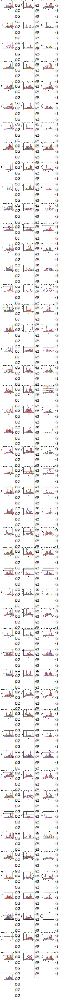

In [38]:
import matplotlib.pyplot as plt

# Filter data for IN direction only
df_in = dfx[dfx['richting'] == 'IN']

import math
site_groups = list(df_in.groupby('siteid'))
n_sites = len(site_groups)
n_cols = 3
n_rows = math.ceil(n_sites / n_cols)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 5 * n_rows), squeeze=False)
axes_flat = axes.flat

for ax, (site_id, group) in zip(axes_flat, site_groups):
    for date, subg in group.groupby('date'):
        ax.plot(subg['hour'], subg['aantal'], marker='o', label=str(date))
    ax.set_title(f'Site {site_id}: Aantal per hour, per date (IN richting)')
    ax.set_xlabel('Hour')
    ax.set_ylabel('Aantal')
    ax.legend(title='Date', bbox_to_anchor=(1.05, 1), loc='upper left')
    ax.margins(x=0)
    ax.grid(True)

# Hide any unused subplots
for extra_ax in axes_flat[len(site_groups):]:
    extra_ax.axis('off')

plt.tight_layout()
plt.show()


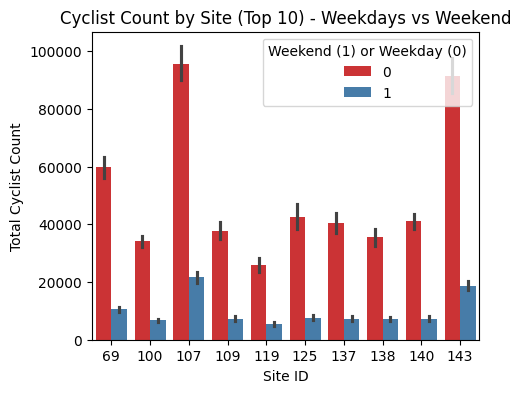

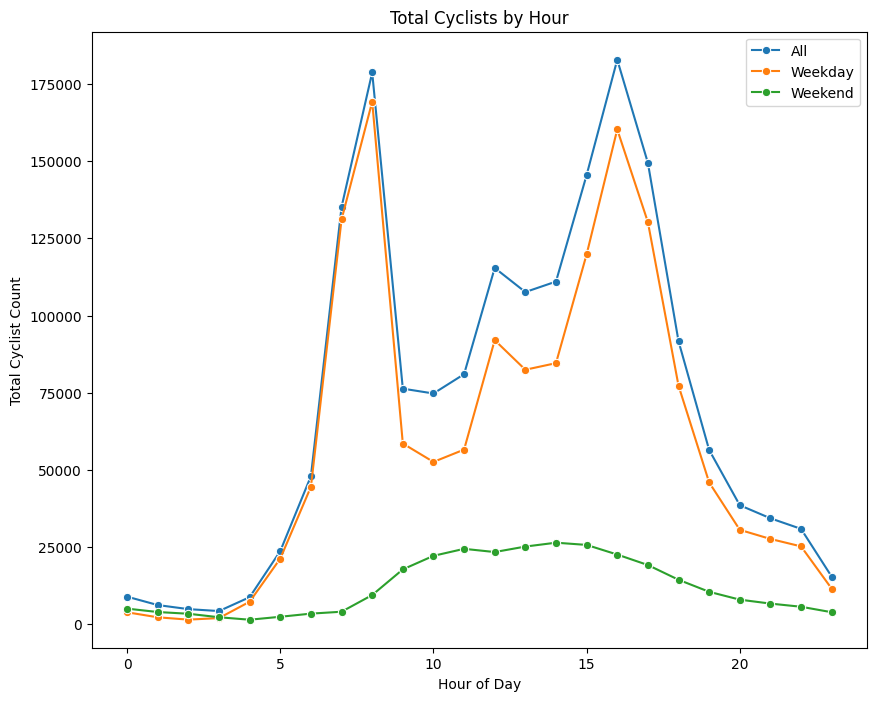

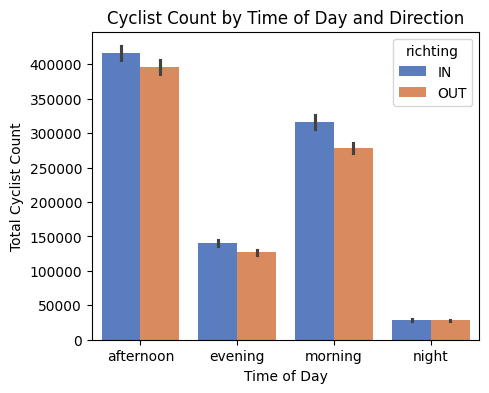

In [40]:
# 1. Total cyclist count per weekday vs weekend for top 10 sites
import seaborn as sns

top10_sites = dfx.groupby('siteid')['aantal'].sum().sort_values(ascending=False).head(10).index
df_top10 = dfx[dfx['siteid'].isin(top10_sites)]

plt.figure(figsize=(5, 4))
sns.barplot(
    data=df_top10, 
    x='siteid', 
    y='aantal', 
    hue='weekend', 
    estimator=sum,
    hue_order=[0, 1],
    palette='Set1'
)
plt.title('Cyclist Count by Site (Top 10) - Weekdays vs Weekend')
plt.xlabel('Site ID')
plt.ylabel('Total Cyclist Count')
plt.legend(title='Weekend (1) or Weekday (0)')
plt.show()

# 2. Total count by hour (all, weekday, weekend)
plt.figure(figsize=(10, 8))
# All days
sns.lineplot(
    data=dfx.groupby('hour')['aantal'].sum().reset_index(), 
    x='hour', y='aantal', marker='o', label='All'
)
# Weekdays
sns.lineplot(
    data=dfx[dfx['weekend']==0].groupby('hour')['aantal'].sum().reset_index(),
    x='hour', y='aantal', marker='o', label='Weekday'
)
# Weekends
sns.lineplot(
    data=dfx[dfx['weekend']==1].groupby('hour')['aantal'].sum().reset_index(),
    x='hour', y='aantal', marker='o', label='Weekend'
)
plt.title('Total Cyclists by Hour')
plt.xlabel('Hour of Day')
plt.ylabel('Total Cyclist Count')
plt.legend()
plt.show()

# 3. Cyclist count by direction and tod (time of day)
plt.figure(figsize=(5, 4))
sns.barplot(
    data=dfx, 
    x='tod', 
    y='aantal', 
    hue='richting', 
    estimator=sum,
    palette='muted'
)
plt.title('Cyclist Count by Time of Day and Direction')
plt.xlabel('Time of Day')
plt.ylabel('Total Cyclist Count')
plt.show()

**Additional data:**
- weather by date
- city: urban, rural, population density, city type 1/2/3?
- number of cyclist in each municipal
- event date

## B. Extra Data

In [50]:
df_rich = pd.read_csv(PATH_RICH, header=None)
df_rich.columns=['siteid', 'richting', 'name']

df_sites = pd.read_csv(PATH_SITES, header=None)
df_sites.columns = ['siteid', 'sitenr', 'longtitude', 'latitude', 'name', 'domain', 'road_number', 'district', 'municipality', 'interval', 'install_date']

df_site_latlong = pd.read_csv("data/site_latlong.csv")
print(df_site_latlong.shape)
display(df_site_latlong.head(2))

(151, 4)


,site_id,longtitude,latitude,naam
0,1,4.456122,50.916183,Machelen
1,2,4.471690,51.275120,Brasschaat 2


### 1. Population density (assume the same from 2019-2026)

Meta data:
- siteid
- lat/long

Features:
- population density within 1km/ 5km/ 10km

In [ ]:
# compute_site_population_buffers(
#     df_sites, 
#     raster_path="extra_data/bel_pop_2025_CN_100m_R2025A_v1.tif",
#     rad_values=[1000, 5000, 10000],
#     buffer_crs="EPSG:31370",
# ).to_csv('data/fts_population.csv', index=False)

In [ ]:
df_site_pop = pd.read_csv('data/fts_population.csv')
df_site_pop.head()

,siteid,siteno,longtitude,latitude,geometry,pop_1km,pop_5km,pop_10km
0,1,100046096,4.456122,50.916183,POINT (4.456121776137429 50.91618331151478),2754.790527,99128.390625,726663.750000
1,2,100052862,4.471690,51.275120,POINT (4.47169 51.27512),1369.083008,165217.234375,590641.437500
2,3,100052863,4.472220,51.275030,POINT (4.47222 51.27503),1213.038208,165126.484375,590422.687500
3,4,100052864,5.190110,51.160230,POINT (5.19011 51.16023),851.324463,27176.691406,118754.562500
4,5,100052865,5.190030,51.160180,POINT (5.19003 51.16018),858.013428,27176.822266,118752.179688


### 2. Weather

Meta data:
- siteid
- lat/long
- date/hour

Features:
- weather features

In [51]:
df_weather = pd.read_csv(PATH_EXTRA_DATA + "belgium_weather_2019_2026.csv").rename(columns={'longitude':'longtitude'})
df_weather['date'] = pd.to_datetime(df_weather['datetime']).dt.date
df_weather['hour'] = pd.to_datetime(df_weather['datetime']).dt.hour
print(df_weather.shape)
df_weather.head(2)

(874800, 15)


,region,latitude,longtitude,datetime,temperature_2m,relative_humidity_2m,precipitation,rain,snowfall,wind_speed_10m,wind_direction_10m,pressure_msl,cloud_cover,date,hour
0,Brussels,50.8503,4.3517,2019-08-01T00:00,15.9,74,0.0,0.0,0.0,13.0,214,1016.9,63,2019-08-01,0
1,Brussels,50.8503,4.3517,2019-08-01T01:00,15.9,76,0.0,0.0,0.0,12.1,217,1017.1,56,2019-08-01,1


In [52]:
df_weather['date'].min(), df_weather['date'].max(), df_weather['date'].nunique()

(datetime.date(2019, 8, 1), datetime.date(2026, 3, 25), 2429)

In [53]:
flander_boundary = gpd.read_file(PATH_EXTRA_DATA + "flander_boundary.geojson")
gdf_weather = df2gdf(df_weather)
df_weather_flander = gpd.sjoin(gdf_weather, flander_boundary[['geometry']], predicate='within').drop(columns='index_right').reset_index(drop=True)
print(df_weather_flander.shape)
print(df_weather_flander['region'].unique())
df_weather_flander.head(2)

(408240, 16)
['Antwerp' 'Ghent' 'Bruges' 'Leuven' 'Hasselt' 'Kortrijk' 'Ostend']


,region,latitude,longtitude,datetime,temperature_2m,relative_humidity_2m,precipitation,rain,snowfall,wind_speed_10m,wind_direction_10m,pressure_msl,cloud_cover,date,hour,geometry
0,Antwerp,51.2194,4.4025,2019-08-01T00:00,16.1,72,0.0,0.0,0.0,12.8,212,1016.5,29,2019-08-01,0,POINT (4.4025 51.2194)
1,Antwerp,51.2194,4.4025,2019-08-01T01:00,16.1,75,0.0,0.0,0.0,12.2,208,1016.7,53,2019-08-01,1,POINT (4.4025 51.2194)


In [54]:
gdf_weather_flander = df2gdf(df_weather_flander.rename(columns={'latitude':'latitude_wt','longtitude':'longtitude_wt'}), long_col='longtitude_wt', lat_col='latitude_wt')
gdf_site_latlong = df2gdf(df_site_latlong)

df_weather_site = gpd.sjoin_nearest(
    gdf_site_latlong, 
    gdf_weather_flander, 
    how='left', 
    distance_col='distance'
).drop(columns=['latitude_wt','longtitude_wt','geometry','index_right'])
print(df_weather_site.shape)
df_weather_site.head(2)

/Users/ponddie/miniconda3/envs/llm_py312/lib/python3.12/site-packages/geopandas/array.py:411: UserWarning: Geometry is in a geographic CRS. Results from 'sjoin_nearest' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  warnings.warn(


(8806320, 18)


,site_id,longtitude,latitude,naam,region,datetime,temperature_2m,relative_humidity_2m,precipitation,rain,snowfall,wind_speed_10m,wind_direction_10m,pressure_msl,cloud_cover,date,hour,distance
0,1,4.456122,50.916183,Machelen,Leuven,2019-08-01T03:00,15.4,80,0.0,0.0,0.0,12.4,206,1017.3,84,2019-08-01,3,0.247072
0,1,4.456122,50.916183,Machelen,Leuven,2019-08-01T02:00,15.6,78,0.0,0.0,0.0,11.6,206,1017.6,84,2019-08-01,2,0.247072


In [55]:
df_weather_site['distance'].max() 
# ==> max distance after merge is m

0.5186326595963657

In [56]:
df_weather_site = df_weather_site[
    df_site_latlong.columns.tolist() + 
    [col for col in df_weather_site.columns.tolist() if col not in df_site_latlong.columns.tolist()]
]
df_weather_site.head(2)

,site_id,longtitude,latitude,naam,region,datetime,temperature_2m,relative_humidity_2m,precipitation,rain,snowfall,wind_speed_10m,wind_direction_10m,pressure_msl,cloud_cover,date,hour,distance
0,1,4.456122,50.916183,Machelen,Leuven,2019-08-01T03:00,15.4,80,0.0,0.0,0.0,12.4,206,1017.3,84,2019-08-01,3,0.247072
0,1,4.456122,50.916183,Machelen,Leuven,2019-08-01T02:00,15.6,78,0.0,0.0,0.0,11.6,206,1017.6,84,2019-08-01,2,0.247072


In [57]:
df_weather_site.to_csv('data/fts_weather.csv', index=False)